In [1]:
from GetIntervalsOffline import Get_Intervals_Offline
from Plot_Data import Plot_Data, Plot_Data_2
from Interval_Pairplot import Interval_Pairplot, KDE_plot
from Plot_All_Intervals import Plot_All_Intervals
from Get_Slopes import Get_Slopes
from CompareSlopes import CompareSlopes
from Plot_Spikes import Plot_Spikes_Offline

import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

## Example for one campaign

In [6]:
# We plot the data to extract principal values, such us t_cut for cycles starting with PD bursting and t_cut for LP bursting
# We could also extract the data for the analysis: in order to get the peaks we need to give a height and a prominence for each neuron,
# and, to separate them into different bursts, we need a maximum distance between 2 spikes from the same burst

Data = '../robot/txt/sub16.txt'
Plot_Data(Data)

KeyboardInterrupt: 

In [ ]:
# PD first: we choose the start time from graphics above
t_cut = 444
first_neuron = 'LP'

prominence_LP_1 = 0.45
prominence_LP_2 = 4
height_LP = 0.3
prominence_PD_1 = 0.25
prominence_PD_2 = 4
height_PD = -4
dist_LP = 9700*t_cut
dist_PD = 5000*t_cut

t, V_PD, V_LP, slices_PD, slices_LP, Intervals = Get_Intervals_Offline(Data, t_cut, first_neuron,prominence_LP_1, prominence_LP_2, prominence_PD_1, prominence_PD_2,height_LP, height_PD, dist_LP, dist_PD)

IndexError: list index out of range

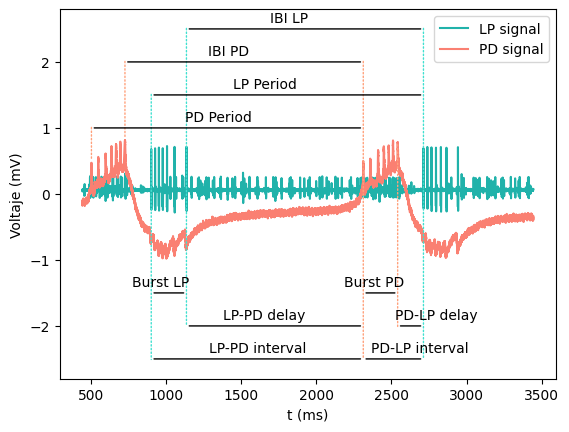

In [ ]:
Plot_All_Intervals(t, V_PD, V_LP, slices_PD, slices_LP, x_min=0, x_max = 30000)

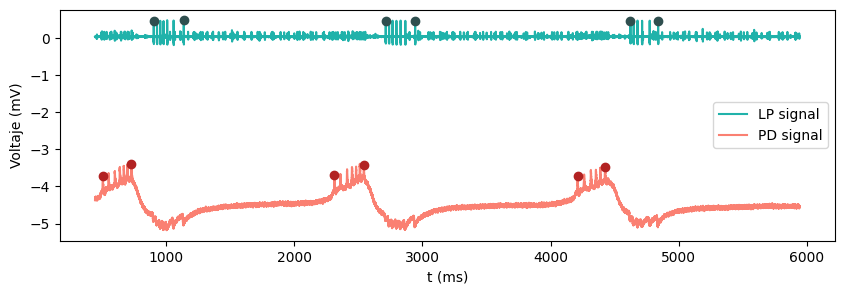

In [ ]:
Plot_Spikes_Offline(t, V_PD, V_LP, slices_PD, slices_LP, 0, 55000)

c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabe

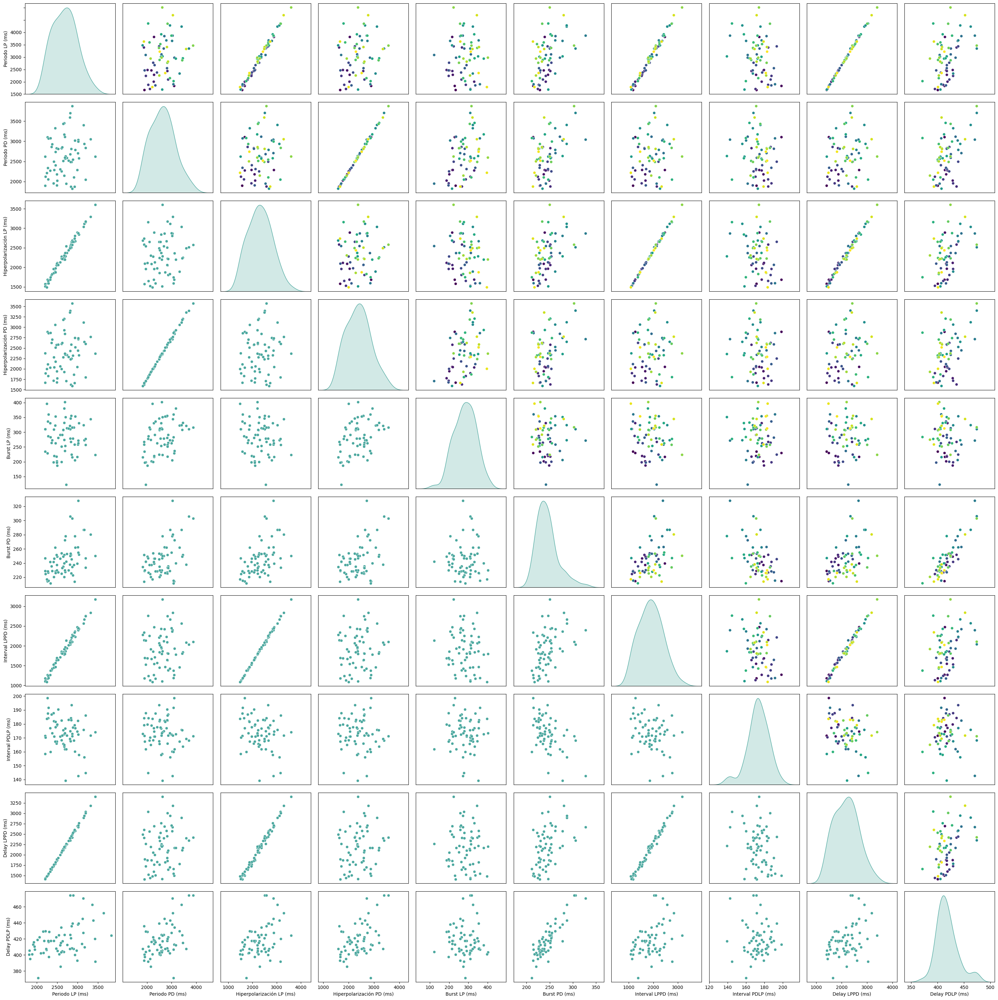

In [ ]:
Interval_Pairplot(Intervals, diagonal_kind='kde', Evolution=True, Cycle_by_cycle=True, hue="Normal", Palette='viridis')

In [ ]:
results = Get_Slopes(Intervals)
results

,Dataset,Slope,Intercept,R^2,Linear?
0,Periodo PD + Periodo LP,0.992656,43.742299,0.999333,True
1,Hiperpolarización LP + Periodo LP,0.993290,312.018309,0.999476,True
2,Hiperpolarización PD + Periodo LP,0.991101,285.113295,0.999225,True
3,Interval LPPD + Periodo LP,0.987420,314.057260,0.999136,True
4,Delay LPPD + Periodo LP,0.994081,3.734455,0.999685,True
5,Hiperpolarización LP + Periodo PD,1.000218,272.550982,0.999302,True
6,Hiperpolarización PD + Periodo PD,0.998358,243.571067,0.999740,True
7,Interval LPPD + Periodo PD,0.994656,272.697155,0.999662,True
8,Delay LPPD + Periodo PD,1.001123,-38.501790,0.999726,True
9,Hiperpolarización PD + Hiperpolarización LP,0.997777,-26.980981,0.999710,True


## Other campaigns

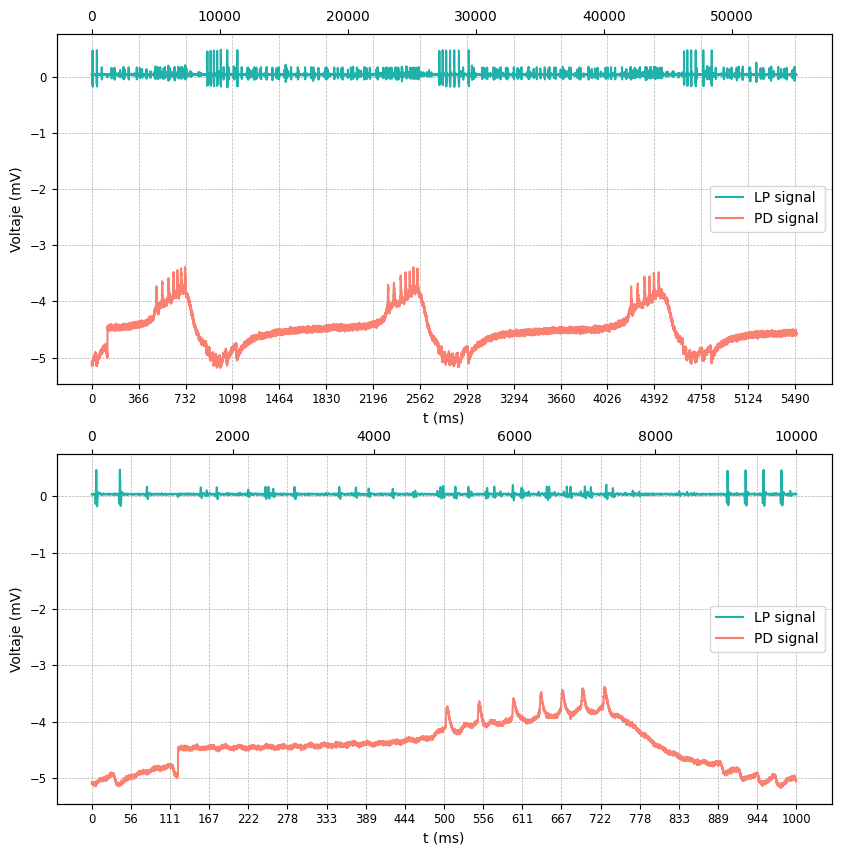

In [ ]:
Data = '../robot/txt/sub16.txt'
Plot_Data(Data)

In [ ]:
first_neuron = 'PD'

parameters = {"sub1.txt": [0.25, 4, 0.35, 0.20, 4, -2.8, 800, 400, 470, 167],
        "sub4.txt": [0.15, 4, 0.25, 0.15, 4, -4.1, 400, 300, 500, 278],
        "sub6.txt": [0.05, 4, 0.05, 0.25, 4, -3.5, 400, 400, 889, 556],
        "sub8.txt": [0.05, 4, 0.05, 0.25, 4, -3.5, 500, 1200, 778, 389],
        "sub10.txt": [0.5, 4, 0.6, 0.75, 4, 2.75, 1000, 1000, 500, 167],
        "sub12.txt": [0.2, 4, 0.25, 0.5, 4, -1.5, 1000, 1000, 1467, 367],
        "sub13.txt": [0.4, 4, 0.41, 0.4, 4, 1.75, 700, 1000, 389, 111],
        "sub14.txt": [0.3, 4, 0.4, 0.25, 4, -4, 1000, 1000, 833, 367],
        "sub15.txt": [0.1, 4, 0.12, 0.25, 4, -4.3, 1300, 5000, 222, 1],
        "sub16.txt": [0.45, 4, 0.3, 0.25, 4, -4, 985, 5000, 833, 444]}
    

campaign = parameters[Data[13:]]

if first_neuron=='PD':
        t_cut = campaign[-1]
elif first_neuron=='LP':
        t_cut = campaign[-2]

prominence_LP_1 = campaign[0]
prominence_LP_2 = campaign[1]
height_LP = campaign[2]
prominence_PD_1 = campaign[3]
prominence_PD_2 = campaign[4]
height_PD = campaign[5]
dist_LP = campaign[6]*t_cut
dist_PD = campaign[7]*t_cut

t, V_PD, V_LP, slices_PD, slices_LP, Intervals = Get_Intervals_Offline(Data, t_cut, first_neuron,prominence_LP_1, prominence_LP_2, prominence_PD_1, prominence_PD_2,height_LP, height_PD, dist_LP, dist_PD)

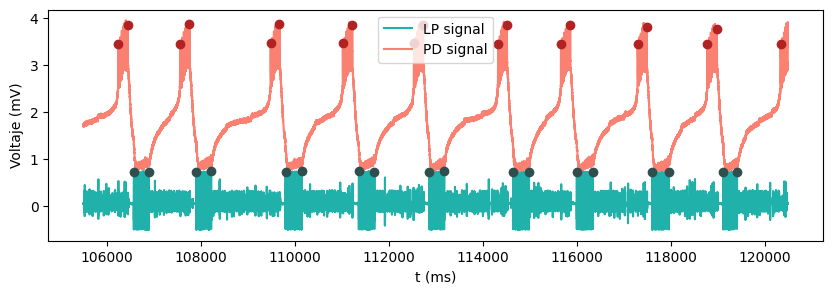

In [ ]:
Plot_Spikes_Offline(t, V_PD, V_LP, slices_PD, slices_LP, 150000*7 , 150000*8 )

c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabe

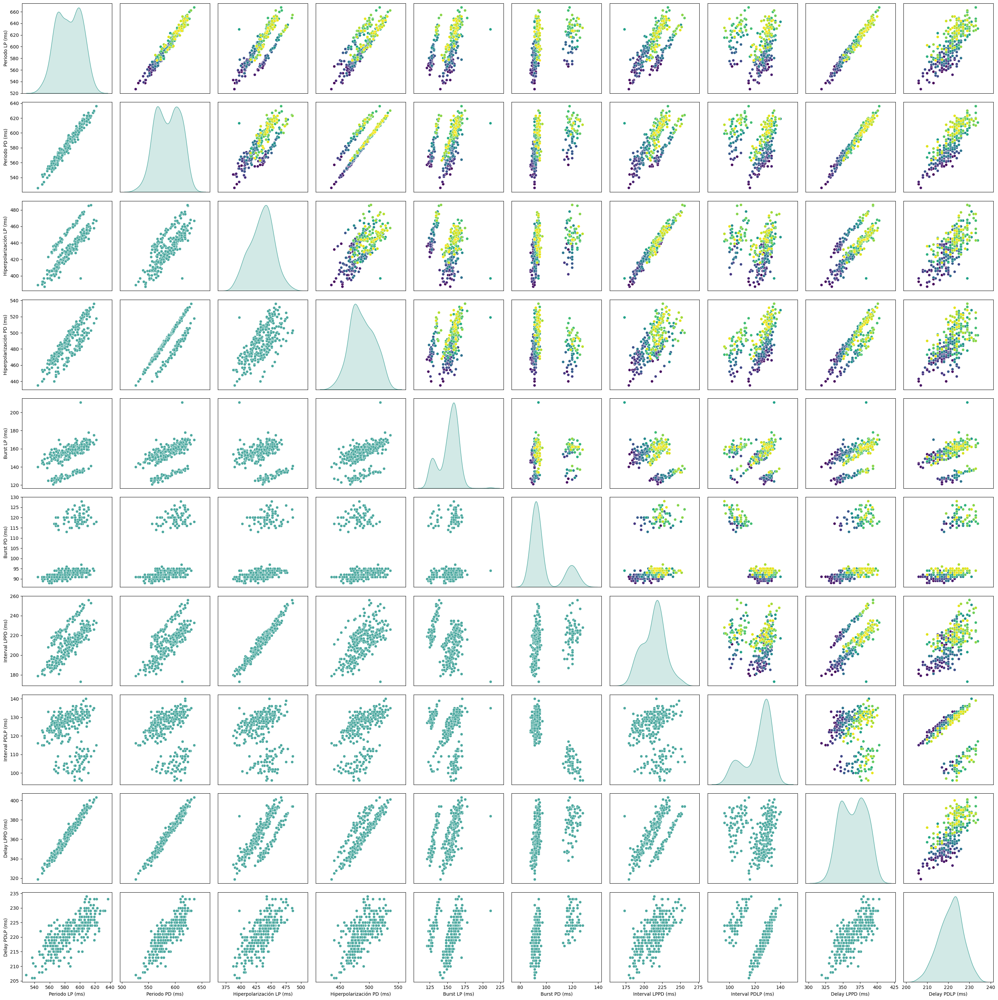

In [ ]:
Interval_Pairplot(Intervals, diagonal_kind='kde', Evolution=True, Cycle_by_cycle=True, hue="Normal", Palette="viridis")

<Axes: xlabel='Periodo LP (ms)', ylabel='Interval PDLP (ms)'>

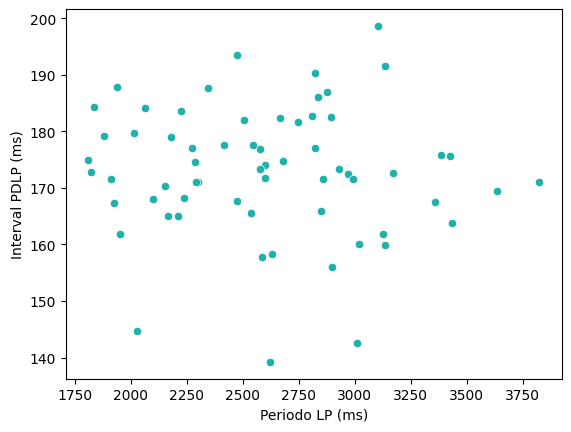

In [ ]:
Hue = range(len(Intervals[:,0]))

data_dict = {"Periodo LP (ms)": Intervals[:,0],
        "Periodo PD (ms)": Intervals[:,1],
        "Hiperpolarización LP (ms)": Intervals[:,2],
        "Hiperpolarización PD (ms)": Intervals[:,3],
        "Burst LP (ms)": Intervals[:,4],
        "Burst PD (ms)": Intervals[:,5],
        "Interval LPPD (ms)": Intervals[:,6],
        "Interval PDLP (ms)": Intervals[:,7],
        "Delay LPPD (ms)": Intervals[:,8],
        "Delay PDLP (ms)": Intervals[:,9],
        "hue": Hue}
data = pd.DataFrame(data_dict)
sns.scatterplot(x=data.columns[0], y=data.columns[7], data=data, color='lightseagreen')

## Slope comparison 

sub1.txt
sub6.txt
sub10.txt
sub12.txt
sub14.txt
sub15.txt
sub16.txt


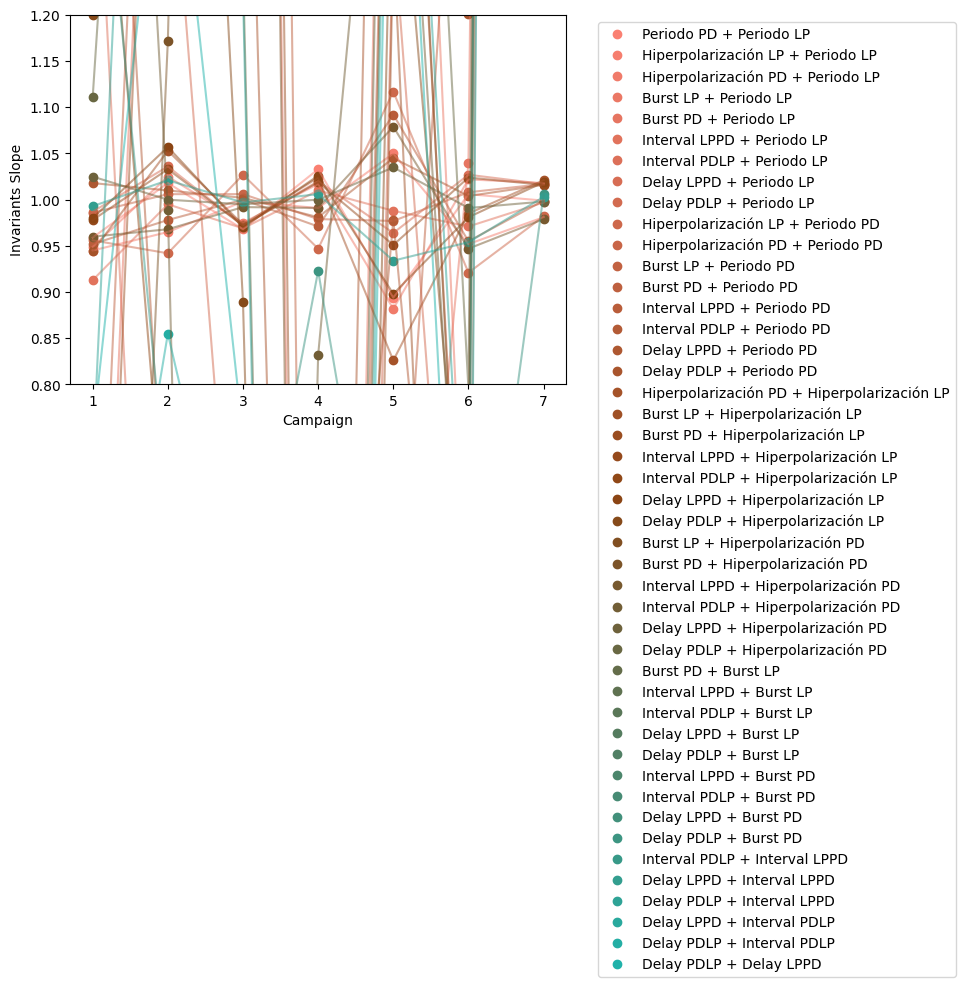

In [2]:
parameters = {"sub1.txt": [0.25, 4, 0.35, 0.20, 4, -2.8, 800, 400, 470, 167],
        #"sub4.txt": [0.15, 4, 0.25, 0.15, 4, -4.1, 400, 300, 500, 278],
        "sub6.txt": [0.05, 4, 0.05, 0.25, 4, -3.5, 400, 400, 889, 556],
        #"sub8.txt": [0.05, 4, 0.05, 0.25, 4, -3.5, 500, 1200, 778, 389],
        "sub10.txt": [0.5, 4, 0.6, 0.75, 4, 2.75, 1000, 1000, 500, 167],
        "sub12.txt": [0.2, 4, 0.25, 0.5, 4, -1.5, 1000, 1000, 1467, 367],
        #"sub13.txt": [0.4, 4, 0.41, 0.4, 4, 1.75, 700, 1000, 389, 111],
        "sub14.txt": [0.3, 4, 0.4, 0.25, 4, -4, 1000, 1000, 833, 367],
        "sub15.txt": [0.1, 4, 0.12, 0.25, 4, -4.3, 1300, 5000, 222, 1],
        "sub16.txt": [0.45, 4, 0.3, 0.25, 4, -4, 985, 5000, 833, 444]}

# Starting all of them with PD
first_neuron = 'PD'

dict = CompareSlopes(parameters, first_neuron, threshold=0.0)

In [3]:
new_dict = pd.DataFrame(dict).transpose().sort_values([1], ascending=False)
new_dict.columns = [ 'Slopes', 'Mean R2', 'St. Dev R2', 'Invariant for n campaigns', 'Campaigns', 'R2']
new_dict

,Slopes,Mean R2,St. Dev R2,Invariant for n campaigns,Campaigns,R2
Delay LPPD + Periodo PD,"[1.018, 1.01, 1.002, 0.981, 1.045, 1.004, 1.016]",0.988429,0.008381,7,"[1., 6., 10, 12, 14, 15, 16]","[0.977, 0.993, 0.998, 0.991, 0.979, 0.982, 0.999]"
Delay LPPD + Hiperpolarización PD,"[1.025, 1.0, 0.995, 1.0, 1.035, 0.991, 0.998]",0.987143,0.013994,7,"[1., 6., 10, 12, 14, 15, 16]","[0.984, 0.99, 0.999, 0.997, 0.956, 0.985, 0.999]"
Hiperpolarización PD + Periodo PD,"[0.986, 1.006, 1.006, 0.979, 0.977, 1.008, 1.017]",0.986571,0.013532,7,"[1., 6., 10, 12, 14, 15, 16]","[0.977, 0.995, 0.999, 0.99, 0.958, 0.989, 0.998]"
Delay LPPD + Periodo LP,"[0.987, 1.036, 0.972, 1.02, 0.964, 1.027, 1.017]",0.986,0.013544,7,"[1., 6., 10, 12, 14, 15, 16]","[0.959, 0.995, 0.998, 0.992, 0.975, 0.984, 0.999]"
Interval LPPD + Hiperpolarización LP,"[0.978, 1.033, 0.972, 1.019, 0.951, 1.024, 1.016]",0.985857,0.013389,7,"[1., 6., 10, 12, 14, 15, 16]","[0.961, 0.995, 0.998, 0.992, 0.972, 0.984, 0.999]"
Periodo PD + Periodo LP,"[0.959, 1.018, 0.968, 1.033, 0.894, 1.006, 0.999]",0.975714,0.020734,7,"[1., 6., 10, 12, 14, 15, 16]","[0.96, 0.987, 0.994, 0.988, 0.936, 0.967, 0.998]"
Hiperpolarización PD + Periodo LP,"[0.949, 1.025, 0.975, 1.017, 0.882, 1.022, 1.018]",0.971286,0.028182,7,"[1., 6., 10, 12, 14, 15, 16]","[0.947, 0.984, 0.996, 0.989, 0.915, 0.97, 0.998]"
Hiperpolarización LP + Periodo LP,"[0.945, 0.965, 0.998, 0.991, 1.05, 0.952, 0.981]",0.966143,0.031746,7,"[1., 6., 10, 12, 14, 15, 16]","[0.928, 0.983, 0.994, 0.997, 0.968, 0.909, 0.984]"
Delay LPPD + Interval LPPD,"[0.993, 1.021, 0.997, 1.006, 0.934, 0.954, 1.003]",0.965286,0.033023,7,"[1., 6., 10, 12, 14, 15, 16]","[0.929, 0.982, 0.994, 0.997, 0.969, 0.903, 0.983]"
Interval LPPD + Periodo PD,"[0.952, 0.978, 1.0, 0.971, 1.092, 0.955, 0.999]",0.960143,0.038245,7,"[1., 6., 10, 12, 14, 15, 16]","[0.906, 0.988, 0.994, 0.986, 0.963, 0.897, 0.987]"


## What about the campaigns we did not use?

They show some PD bursts significantly larger than others so that we could separate data in two clusters and analyze them individually:

In [ ]:
parameters = {"sub4.txt": [0.15, 4, 0.25, 0.15, 4, -4.1, 300, 300, 500, 278],
        "sub8.txt": [0.145, 4, 0.06, 0.25, 4, -3.5, 500, 1000, 778, 389],
        "sub13.txt": [0.4, 4, 0.41, 0.4, 4, 1.75, 700, 1000, 389, 111]}

c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:91: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabe

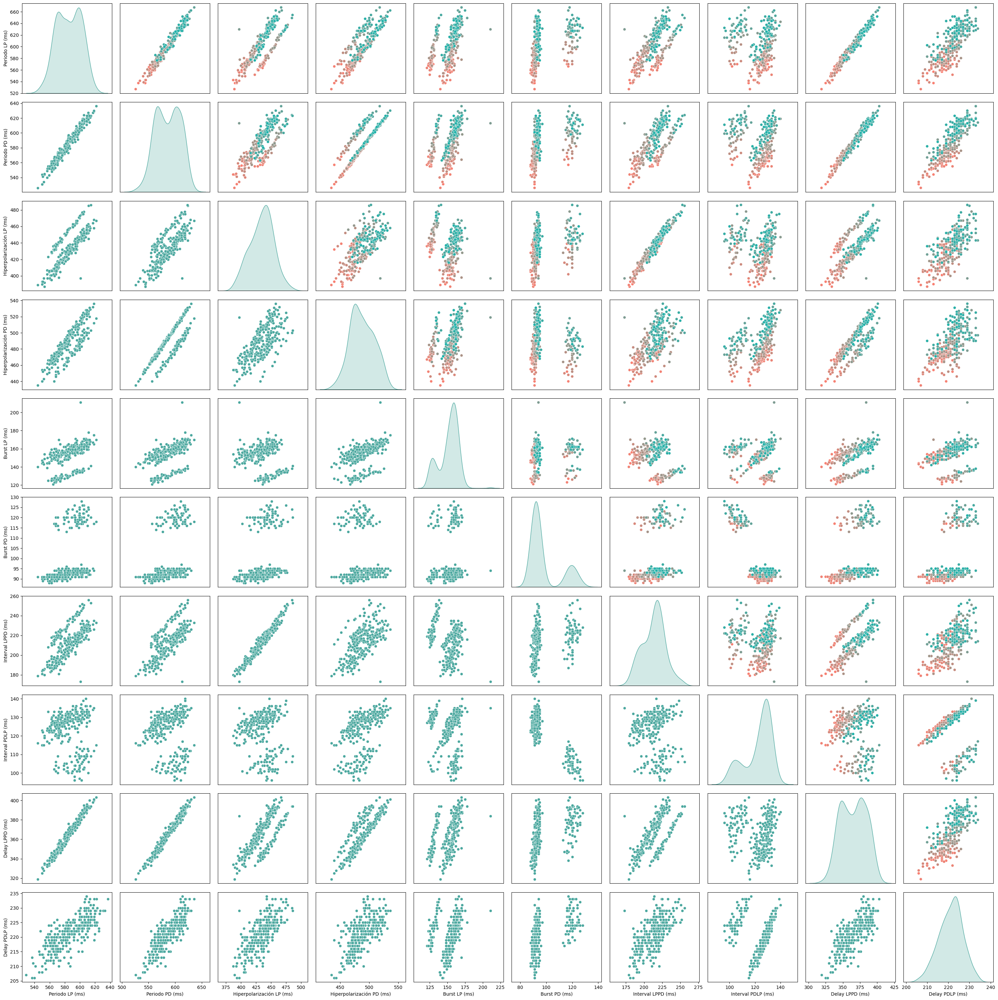

In [ ]:
Data = '../robot/txt/sub13.txt'
first_neuron = 'PD'
campaign = parameters[Data[13:]]

if first_neuron=='PD':
        t_cut = campaign[-1]
elif first_neuron=='LP':
        t_cut = campaign[-2]

prominence_LP_1 = campaign[0]
prominence_LP_2 = campaign[1]
height_LP = campaign[2]
prominence_PD_1 = campaign[3]
prominence_PD_2 = campaign[4]
height_PD = campaign[5]
dist_LP = campaign[6]*t_cut
dist_PD = campaign[7]*t_cut

t, V_PD, V_LP, slices_PD, slices_LP, Intervals = Get_Intervals_Offline(Data, t_cut, first_neuron,prominence_LP_1, prominence_LP_2, prominence_PD_1, prominence_PD_2,height_LP, height_PD, dist_LP, dist_PD)
Interval_Pairplot(Intervals, diagonal_kind='kde', Evolution=True, Cycle_by_cycle=True, hue="Normal", ishue2=False)

c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(ytick

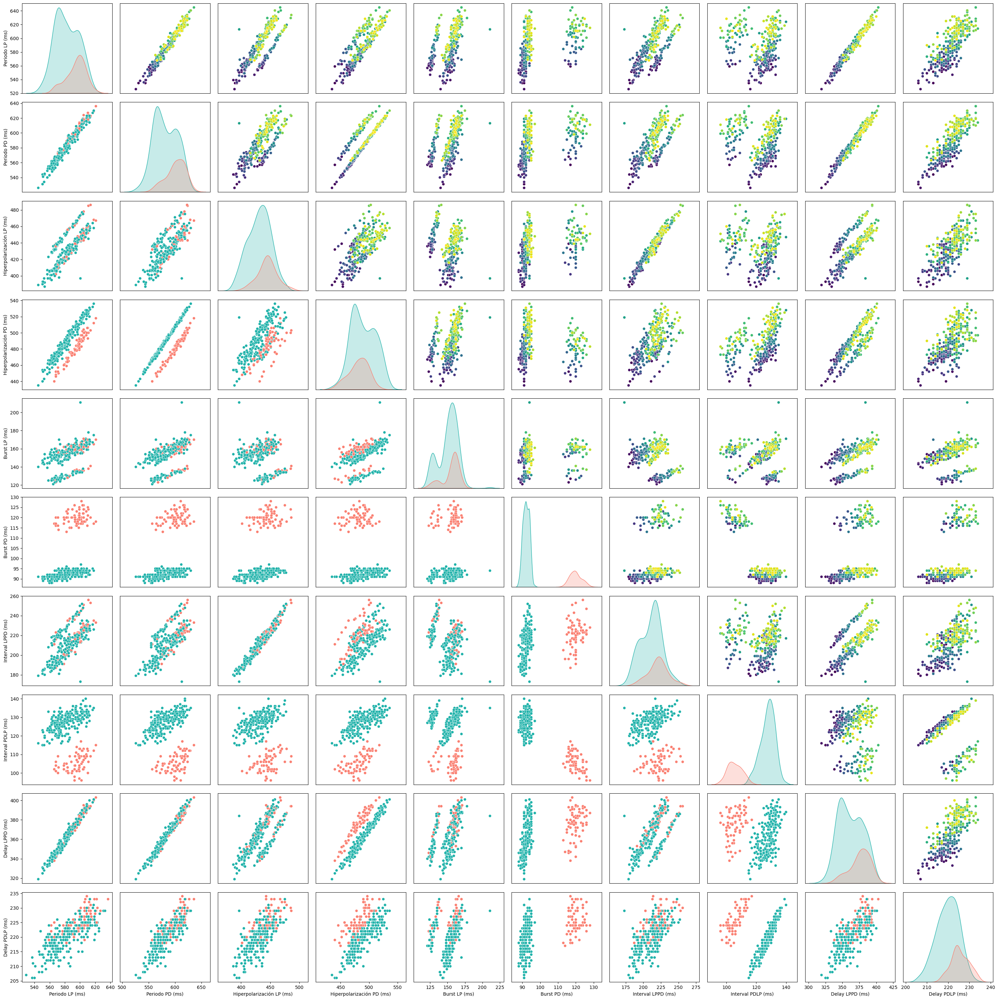

In [ ]:
from sklearn.cluster import AgglomerativeClustering 
clustering = AgglomerativeClustering().fit(np.array(Intervals[:,5]).reshape(-1,1))
target = clustering.fit_predict(np.array(Intervals[:,5]).reshape(-1,1))

Interval_Pairplot(Intervals, diagonal_kind='kde', diag='Double', Evolution=True, Cycle_by_cycle=True, hue='Normal', ishue2=True, hue2=target, Palette='viridis')

c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(yticklabels=axes[0,1].get_yticklabels())
c:\Users\Shania\Documents\GitHub\TFM\Definitivo\Interval_Pairplot.py:195: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[0,0].set(ytick

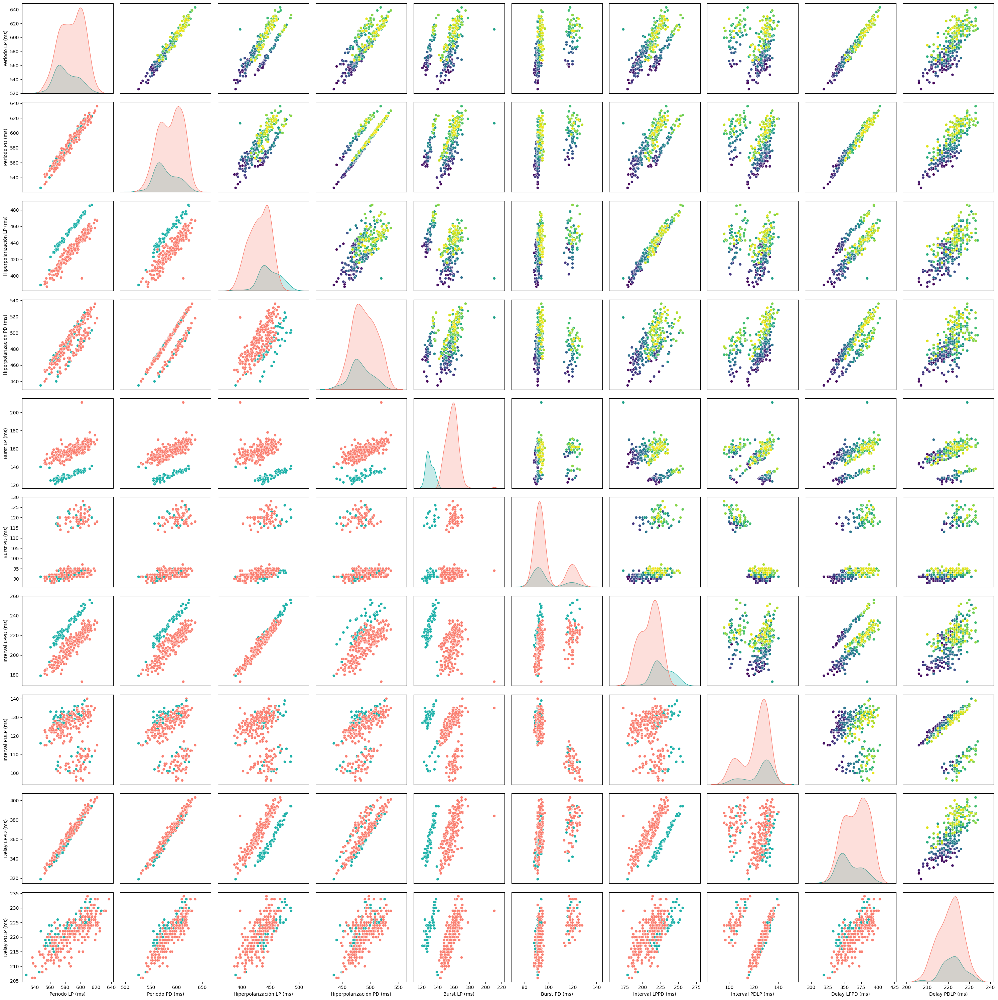

In [ ]:
clustering = AgglomerativeClustering().fit(np.array(Intervals[:,4]).reshape(-1,1))
target2 = clustering.fit_predict(np.array(Intervals[:,4]).reshape(-1,1))

Interval_Pairplot(Intervals, diagonal_kind='kde', Evolution=True, Cycle_by_cycle=True, hue='Normal', ishue2=True, hue2=target2, diag='Double', Palette='viridis')

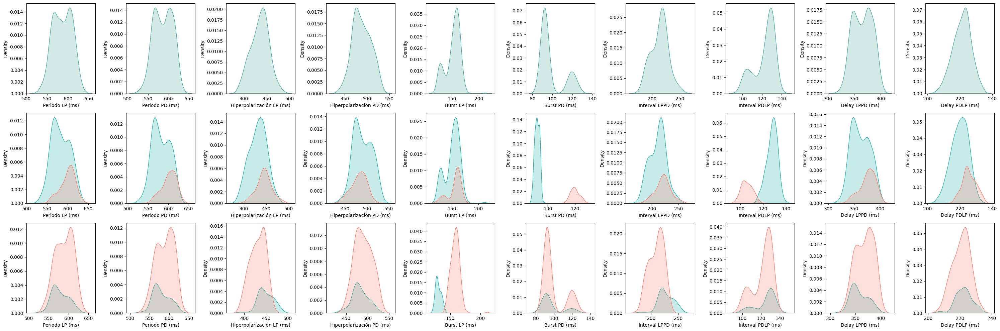

In [ ]:
KDE_plot(Intervals, target, target2, Palette="blend:salmon,lightseagreen", Palette2="blend:salmon,lightseagreen", color='#4ca89f')

In [ ]:
np.concatenate((target.reshape(-1,1), target2.reshape(-1,1)), axis=1)

array([[1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [0, 1],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 0],
       [0, 1],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [1, 0],
       [1, 1],
       [1, 1],
       [1, 0],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 1],
       [1, 1],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 1],
       [1, 1],
       [1, 1],
       [0, 0],
       [1, 1],
       [0, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 0],
       [1, 1],
       [1, 1],
       [0, 1],
       [1, 1],
       [1, 0],
       [1, 0],
       [1, 1],
       [1, 0],
       [1, 1],
       [1, 1],
       [0, 0],
       [1,

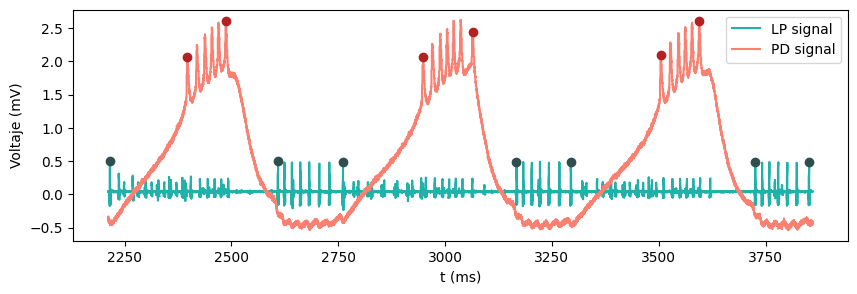

In [ ]:
Plot_Spikes_Offline(t, V_PD, V_LP, slices_PD, slices_LP, 21000, 37500)

In [ ]:
sns.color_palette("blend:salmon,lightseagreen", as_cmap=False)

[(0.9803921568627451, 0.5019607843137255, 0.4470588235294118),
 (0.8094117647058823, 0.5411764705882353, 0.49098039215686273),
 (0.6384313725490196, 0.580392156862745, 0.5349019607843137),
 (0.4674509803921568, 0.6196078431372549, 0.5788235294117647),
 (0.29647058823529404, 0.6588235294117647, 0.6227450980392157),
 (0.12549019607843137, 0.6980392156862745, 0.6666666666666666)]

In [ ]:
a = sns.color_palette("blend:salmon,lightseagreen", as_cmap=False)
b = a.as_hex()[:]

In [ ]:
b

['#fa8072', '#ce8a7d', '#a39488', '#779e94', '#4ca89f', '#20b2aa']

## Intervals Boxplot

sub1.txt
sub4.txt
sub6.txt
sub8.txt
sub10.txt
sub12.txt
sub13.txt
sub14.txt
sub15.txt
sub16.txt


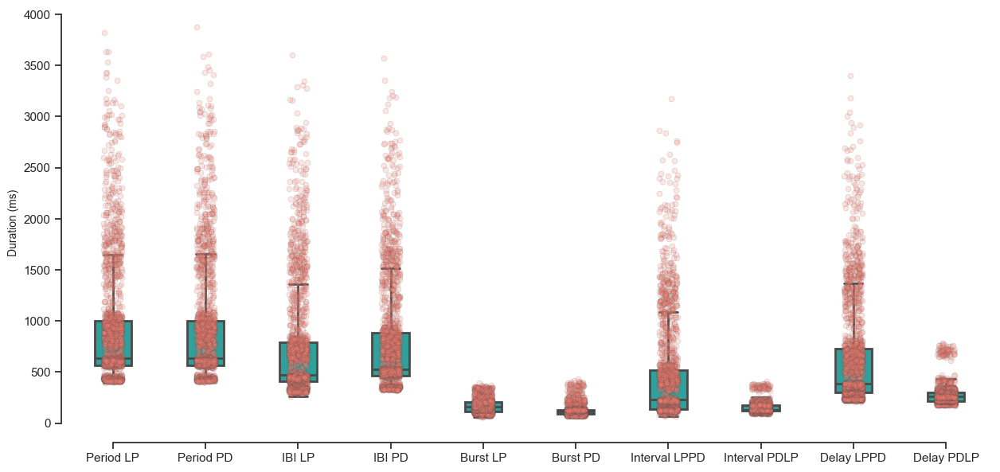

In [ ]:
parameters = {"sub1.txt": [0.25, 4, 0.35, 0.20, 4, -2.8, 800, 400, 470, 167],
        "sub4.txt": [0.15, 4, 0.25, 0.15, 4, -4.1, 400, 300, 500, 278],
        "sub6.txt": [0.05, 4, 0.05, 0.25, 4, -3.5, 400, 400, 889, 556],
        "sub8.txt": [0.05, 4, 0.05, 0.25, 4, -3.5, 500, 1200, 778, 389],
        "sub10.txt": [0.5, 4, 0.6, 0.75, 4, 2.75, 1000, 1000, 500, 167],
        "sub12.txt": [0.2, 4, 0.25, 0.5, 4, -1.5, 1000, 1000, 1467, 367],
        "sub13.txt": [0.4, 4, 0.41, 0.4, 4, 1.75, 700, 1000, 389, 111],
        "sub14.txt": [0.3, 4, 0.4, 0.25, 4, -4, 1000, 1000, 833, 367],
        "sub15.txt": [0.1, 4, 0.12, 0.25, 4, -4.3, 1300, 5000, 222, 1],
        "sub16.txt": [0.45, 4, 0.3, 0.25, 4, -4, 985, 5000, 833, 444]}


# Starting all of them with PD
first_neuron = 'PD'

from Get_Boxplot import Get_Boxplot
Get_Boxplot(parameters, first_neuron)

## Extras

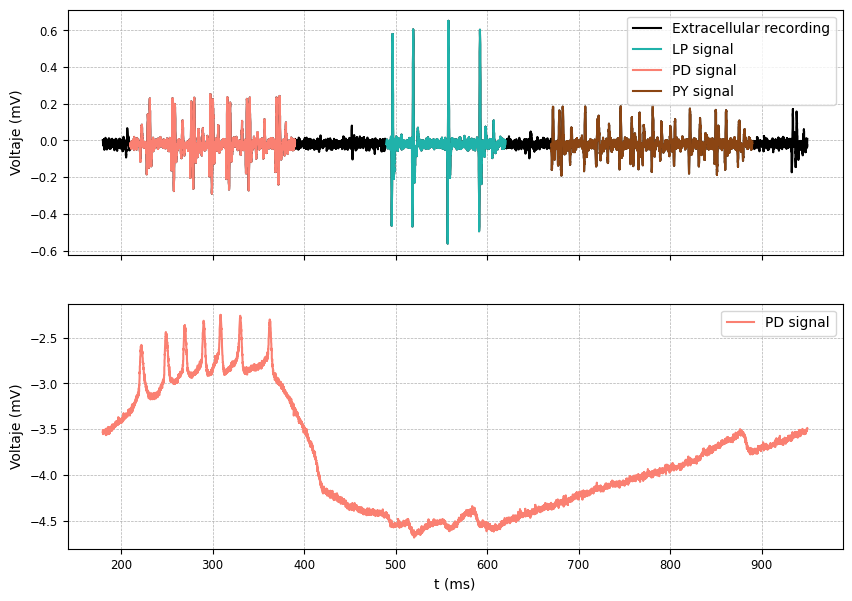

In [ ]:
# We plot the data to extract principal values, such us t_cut for cycles starting with PD bursting and t_cut for LP bursting
# We could also extract the data for the analysis: in order to get the peaks we need to give a height and a prominence for each neuron,
# and, to separate them into different bursts, we need a maximum distance between 2 spikes from the same burst

Data = '../robot/txt/sub1.txt'
Plot_Data_2(Data)